## DIGITS Decision Tree

In [43]:
%matplotlib inline

import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

from sklearn import model_selection as cv
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

from statsmodels.stats.proportion import proportion_confint

In [44]:
smoking_dataset = pd.read_csv(filepath_or_buffer="Dataset/Smoking_preprocessed.csv")

X = smoking_dataset.iloc[:, :-1]
y = smoking_dataset.loc[:, "smoking"]
(X_train, X_test,  y_train, y_test) = cv.train_test_split(X, y, test_size = .3, random_state = 1)

In [45]:
print(X_train)
print(y_train)

       gender  age  height  weight  waist  sightL  sightR  hearL  hearR  \
4680        0   40     160      45   64.2     0.8     0.5      0      0   
49491       1   20     165      60   78.4     1.2     1.2      0      0   
11975       0   45     160      50   66.0     0.9     0.8      0      0   
29800       1   35     170      70   82.0     0.4     0.4      0      0   
14692       0   40     160      50   65.8     0.9     1.0      0      0   
...       ...  ...     ...     ...    ...     ...     ...    ...    ...   
50057       1   50     180     105  106.5     1.2     1.2      0      0   
32511       1   60     165      75   90.0     1.2     1.0      0      0   
5192        1   20     170      75   87.0     0.6     0.8      0      0   
12172       0   40     160      50   65.5     1.5     1.2      0      0   
33003       0   40     155      55   70.0     1.2     1.2      0      0   

       systolicP  ...   hdl    ldl  hemoglobin  uProtein  sCreatinine   ast  \
4680       119.0  ..

### Balanced dataset vs Unbalanced dataset

#### Balanced dataset

##### Training Gaussian NB to compare the results

In [46]:
undersampler = RandomUnderSampler(sampling_strategy="majority", random_state=1)
X_under, y_under = undersampler.fit_resample(X_train, y_train)

print(y_train.value_counts())
print(y_under.value_counts())

smoking
0    24521
1    14324
Name: count, dtype: int64
smoking
0    14324
1    14324
Name: count, dtype: int64


In [47]:
clf = GaussianNB()
prediction = clf.fit(X_under.values, y_under.values).predict(X_test.values)

print(confusion_matrix(y_test, prediction))
print(f"\nAccuracy: {accuracy_score(y_test, prediction)}")

print(classification_report(y_test, prediction))

epsilon = accuracy_score(y_test, prediction)
print(epsilon)

#confidence interval
proportion_confint(
    count = int(np.floor(epsilon * X_test.shape[0])), 
    nobs = X_test.shape[0], 
    alpha = 0.05, 
    method = "binom_test"
)

[[6558 4027]
 [ 891 5173]]

Accuracy: 0.7046068832962941
              precision    recall  f1-score   support

           0       0.88      0.62      0.73     10585
           1       0.56      0.85      0.68      6064

    accuracy                           0.70     16649
   macro avg       0.72      0.74      0.70     16649
weighted avg       0.76      0.70      0.71     16649

0.7046068832962941


(0.697612885906558, 0.7115178890636662)

#### Training a Decision Tree

The line below might take a while (more than 10 min)

In [48]:
from sklearn.model_selection import GridSearchCV

params = {
    "model__min_impurity_decrease": list(np.linspace(0,0.5,21)),
    "model__min_samples_split":list(range(2,20,11)),
    "model__min_samples_leaf": list(range(1, 10000, 750)),
    "model__max_depth": list(range(2, 200, 20))
}

pipeline = Pipeline(steps=[('undersampler', undersampler), ('model', DecisionTreeClassifier(criterion="entropy"))])
clf = GridSearchCV(
    pipeline,
    param_grid = params,
    cv = 10,  # OBS: # If cv is integer, by default is Stratifyed 
    n_jobs = -1,
    verbose = 2
) 
clf.fit(X_train, y_train)
print(f"Best Params = {clf.best_params_}  -  Accuracy = {clf.best_score_}")

Fitting 10 folds for each of 5880 candidates, totalling 58800 fits


[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.1s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.1s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.2s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.1s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.1s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=2; total time=   0.2s
[CV] END model__max_depth=2, model__min_impurity_decrease=0.0, model__min_samples_leaf=1, model__min_samples_split=13; total time=   0.1s
[CV] END model__max_depth=2, model__min_

In [50]:
# Best found params: {'model__max_depth': 82, 'model__min_impurity_decrease': 0.0, 'model__min_samples_leaf': 1, 'model__min_samples_split': 2}
best_params = {'model__max_depth': 82, 'model__min_impurity_decrease': 0.0, 'model__min_samples_leaf': 1, 'model__min_samples_split': 2}

cdt= DecisionTreeClassifier(
    criterion = "entropy", 
    min_samples_split = best_params["model__min_samples_split"],
    min_impurity_decrease = best_params["model__min_impurity_decrease"],
    min_samples_leaf = best_params["model__min_samples_leaf"],
    max_depth = best_params["model__max_depth"]
)
clf = cdt.fit(X_under, y_under)
pred = clf.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(f"prediction: {[pred]}")
print(clf.score(X_test, y_test))
print(confusion_matrix(y_test, pred))
print(f"\nAccuracy: {accuracy_score(y_test, pred)}\n")
print(classification_report(y_test, pred))

epsilon = accuracy_score(y_test, pred)
print(epsilon)
#print("Interval of confidence:", proportion_confint(count=epsilon*X_test.shape[0], nobs=X_test.shape[0], alpha=0.05, method='binom_test'))

prediction: [array([1, 0, 0, ..., 0, 1, 0])]
0.7477325965523455
[[7850 2735]
 [1465 4599]]

Accuracy: 0.7477325965523455

              precision    recall  f1-score   support

           0       0.84      0.74      0.79     10585
           1       0.63      0.76      0.69      6064

    accuracy                           0.75     16649
   macro avg       0.73      0.75      0.74     16649
weighted avg       0.76      0.75      0.75     16649

0.7477325965523455


#### Unbalanced dataset

In [51]:
clf = GaussianNB()
prediction = clf.fit(X_train.values, y_train.values).predict(X_test.values)

print(confusion_matrix(y_test, prediction))
print(f"\nAccuracy: {accuracy_score(y_test, prediction)}")

print(classification_report(y_test, prediction))

epsilon = accuracy_score(y_test, prediction)
print(epsilon)

#confidence interval
proportion_confint(
    count = int(np.floor(epsilon * X_test.shape[0])), 
    nobs = X_test.shape[0], 
    alpha = 0.05, 
    method = "binom_test"
)

[[6796 3789]
 [1125 4939]]

Accuracy: 0.7048471379662442
              precision    recall  f1-score   support

           0       0.86      0.64      0.73     10585
           1       0.57      0.81      0.67      6064

    accuracy                           0.70     16649
   macro avg       0.71      0.73      0.70     16649
weighted avg       0.75      0.70      0.71     16649

0.7048471379662442


(0.6978531516155672, 0.7117581560386317)

#### Training a Decision Tree

The line below might take a while (more than 10 min)

In [52]:
from sklearn.model_selection import GridSearchCV

params = {
    "min_impurity_decrease": list(np.linspace(0,0.5,21)),
    "min_samples_split":list(range(2,20,11)),
    "min_samples_leaf": list(range(1, 10000, 750)),
    "max_depth": list(range(2, 200, 20))
}
clf = GridSearchCV(
    DecisionTreeClassifier(criterion = "entropy"), 
    param_grid = params,
    cv = 10,  # OBS: # If cv is integer, by default is Stratifyed 
    n_jobs = -1,
    verbose = 2
) 
clf.fit(X_train, y_train)
print(f"Best Params = {clf.best_params_}  -  Accuracy = {clf.best_score_}")

Fitting 10 folds for each of 5880 candidates, totalling 58800 fits
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=2, min_impurity_decrease=0.0, min_samples_

In [53]:
# Best found params : {'max_depth': 42, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2}
best_params = {'max_depth': 42, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2}

cdt= DecisionTreeClassifier(
    criterion = "entropy", 
    min_samples_split = best_params["min_samples_split"],
    min_impurity_decrease = best_params["min_impurity_decrease"],
    min_samples_leaf = best_params["min_samples_leaf"],
    max_depth = best_params["max_depth"]    
)
clf = cdt.fit(X_train, y_train)
pred = clf.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(f"prediction: {[pred]}")
print(clf.score(X_test, y_test))
print(confusion_matrix(y_test, pred))
print(f"\nAccuracy: {accuracy_score(y_test, pred)}\n")
print(classification_report(y_test, pred))

epsilon = accuracy_score(y_test, pred)
print(epsilon)
#print("Interval of confidence:", proportion_confint(count=epsilon*X_test.shape[0], nobs=X_test.shape[0], alpha=0.05, method='binom_test'))

prediction: [array([1, 0, 0, ..., 0, 1, 1])]
0.7769235389512884
[[8707 1878]
 [1836 4228]]

Accuracy: 0.7769235389512884

              precision    recall  f1-score   support

           0       0.83      0.82      0.82     10585
           1       0.69      0.70      0.69      6064

    accuracy                           0.78     16649
   macro avg       0.76      0.76      0.76     16649
weighted avg       0.78      0.78      0.78     16649

0.7769235389512884


Printing feature importances

In [54]:
feature_importances = {smoking_dataset.columns[i]:x for i, x in enumerate(clf.feature_importances_)}
for column, importance in feature_importances.items():
    print(column, " : ", importance)

gender  :  0.23856408683448116
age  :  0.0303876352560409
height  :  0.016935059823138476
weight  :  0.018704427214710828
waist  :  0.05503133731438401
sightL  :  0.02626562108728107
sightR  :  0.023400774736092117
hearL  :  0.0009183733784028367
hearR  :  0.0012093532208272346
systolicP  :  0.04604479261878352
diastolicP  :  0.03769267627020382
fastBSugar  :  0.04947988694276415
cholesterol  :  0.04379061072678063
triglyceride  :  0.06520140700913335
hdl  :  0.05042055276038618
ldl  :  0.05014154537591135
hemoglobin  :  0.051846787799745414
uProtein  :  0.004596067353459473
sCreatinine  :  0.02427374688062494
ast  :  0.03947861779411878
alt  :  0.04506424197788614
gtp  :  0.06571860670992431
caries  :  0.0073771896672670785
tartar  :  0.0074566012476523745


### Plotting a pruned version of the Tree chosen with the unbalanced dataset

0.7322962340080486
[[8459 2126]
 [2331 3733]]

Accuracy: 0.7322962340080486

              precision    recall  f1-score   support

           0       0.78      0.80      0.79     10585
           1       0.64      0.62      0.63      6064

    accuracy                           0.73     16649
   macro avg       0.71      0.71      0.71     16649
weighted avg       0.73      0.73      0.73     16649



<Figure size 80000x8000 with 0 Axes>

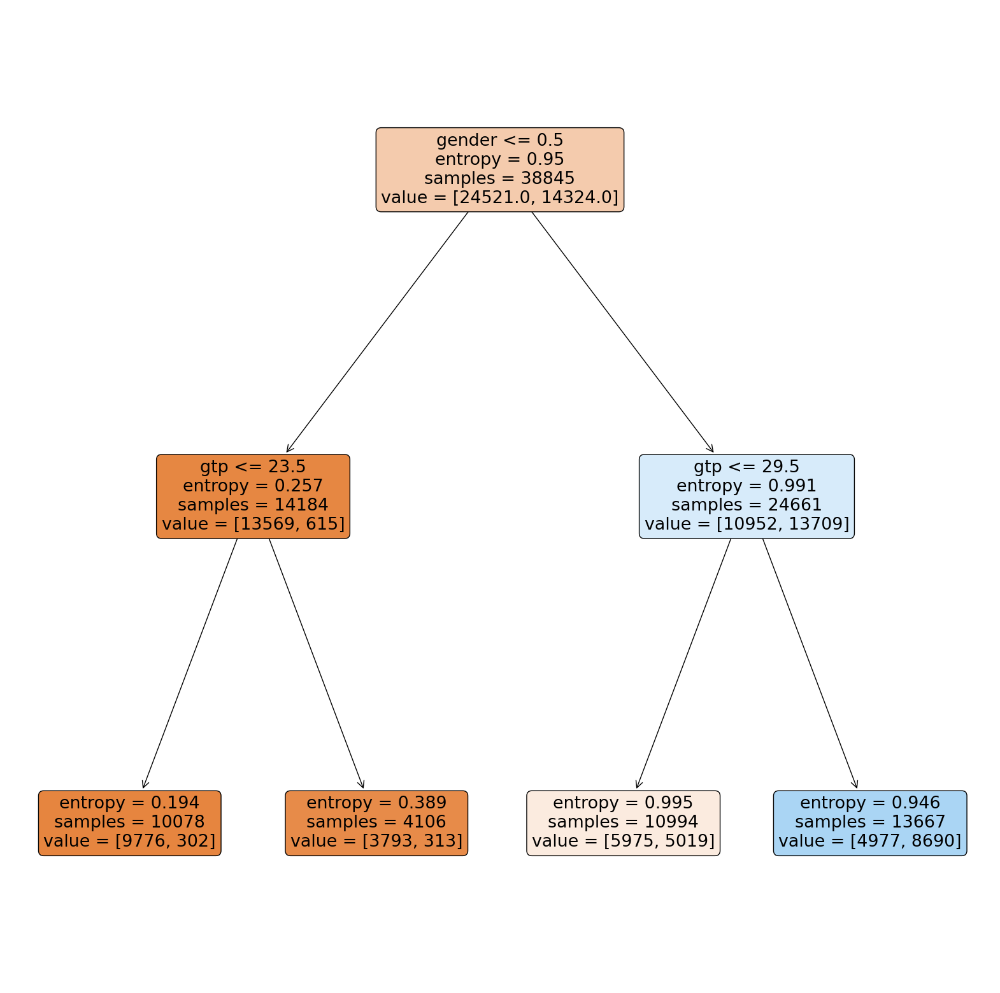

In [55]:
cdt= DecisionTreeClassifier(
    criterion = "entropy", 
    min_samples_split = best_params["min_samples_split"],
    min_impurity_decrease = best_params["min_impurity_decrease"],
    min_samples_leaf = best_params["min_samples_leaf"],
    max_depth = 2
)

clf = cdt.fit(X_train, y_train)
prediction = clf.predict(X_test)

# Obtain accuracy score of learned classifier on test data
print(clf.score(X_test, y_test))
print(confusion_matrix(y_test, prediction))
print(f"\nAccuracy: {accuracy_score(y_test, prediction)}\n")
print(classification_report(y_test, prediction))
epsilon = accuracy_score(y_test, prediction)

fig = plt.gcf()
fig.set_size_inches(800, 80)
plt.figure(figsize=(20,20))
plot_tree(clf, feature_names=X.columns, filled=True,rounded=True)
#fig.savefig('tree.png')
plt.show()